In [1]:
import pandas as pd
import numpy as np
import os
import json
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
from scipy import stats
import warnings
warnings.filterwarnings('ignore')

from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, root_mean_squared_error, mean_absolute_percentage_error
from sklearn.preprocessing import MinMaxScaler, StandardScaler

from sklearn.neighbors import KNeighborsClassifier
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, classification_report
from imblearn.over_sampling import SMOTE
from imblearn.over_sampling import SMOTENC

from sklearn.model_selection import GridSearchCV

from sklearn.metrics import classification_report
from sklearn.ensemble import GradientBoostingClassifier
from xgboost import XGBClassifier

from sklearn.preprocessing import LabelEncoder

mm = MinMaxScaler()
ss = StandardScaler()

from sklearn.preprocessing import LabelEncoder
from sklearn.decomposition import PCA

**Load the Dataset**

In [2]:

df = pd.read_csv("synthetic_food_dataset_imbalanced.csv")

print(df.head())

     Calories    Protein        Fat      Carbs      Sugar     Fiber  \
0  290.463673  14.340084  14.152608  35.266644   4.828030  1.291432   
1  212.626748   4.080908  11.621584  23.218957  16.347814  0.130303   
2  330.695408  14.326708  19.747680  29.479164   6.251137  0.794477   
3  198.070798   9.452445   5.475896  32.097878   2.984621  1.710468   
4  274.496228   6.099547  16.256002  29.756638  17.352958  1.465676   

       Sodium  Cholesterol  Glycemic_Index  Water_Content  Serving_Size  \
0  647.553389    24.990309       81.575896      45.669118    197.570043   
1   68.572414    34.301652       69.522492      49.854415    103.833510   
2  663.171859    34.816834       62.552384      40.132866    198.989367   
3  300.749543    28.510998       68.688853      57.423461    135.714202   
4  296.314958    15.403173       70.385059      33.170460     73.019474   

  Meal_Type Preparation_Method  Is_Vegan  Is_Gluten_Free  Food_Name  
0    dinner              fried     False           F

**Check Dataset Size and Info**

In [3]:
print(f"Dataset Shape: {df.shape}")
df.info()

Dataset Shape: (31700, 16)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 31700 entries, 0 to 31699
Data columns (total 16 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Calories            31325 non-null  float64
 1   Protein             31325 non-null  float64
 2   Fat                 31325 non-null  float64
 3   Carbs               31325 non-null  float64
 4   Sugar               31325 non-null  float64
 5   Fiber               31325 non-null  float64
 6   Sodium              31325 non-null  float64
 7   Cholesterol         31325 non-null  float64
 8   Glycemic_Index      31325 non-null  float64
 9   Water_Content       31325 non-null  float64
 10  Serving_Size        31325 non-null  float64
 11  Meal_Type           31700 non-null  object 
 12  Preparation_Method  31700 non-null  object 
 13  Is_Vegan            31700 non-null  bool   
 14  Is_Gluten_Free      31700 non-null  bool   
 15  Food_Name           31700 

**Check for Missing Values and**

In [4]:
missing = df.isnull().sum()
print("Missing values per column:\n", missing)

duplicates = df.duplicated().sum()
print(f"\nNumber of duplicate rows: {duplicates}")

Missing values per column:
 Calories              375
Protein               375
Fat                   375
Carbs                 375
Sugar                 375
Fiber                 375
Sodium                375
Cholesterol           375
Glycemic_Index        375
Water_Content         375
Serving_Size          375
Meal_Type               0
Preparation_Method      0
Is_Vegan                0
Is_Gluten_Free          0
Food_Name               0
dtype: int64

Number of duplicate rows: 313


**Data Preprocessing**

In [5]:
nutrient_columns = ['Calories', 'Protein', 'Fat', 'Carbs', 'Sugar', 'Fiber', 
                    'Sodium', 'Cholesterol', 'Glycemic_Index', 
                    'Water_Content', 'Serving_Size']

df = df.dropna(subset=nutrient_columns)
print(f"Shape after dropping rows with missing values: {df.shape}")

Shape after dropping rows with missing values: (31325, 16)


**Remove Duplicate Entries**

In [6]:
df = df.drop_duplicates()
print(f"Shape after removing duplicates: {df.shape}")

Shape after removing duplicates: (31260, 16)


**Exploratory Data Analysis**

In [7]:
# Average calories based on meal type
#Copy data set
AnalysisData = df
categorical_cols = ['Meal_Type', 'Preparation_Method', 'Is_Vegan', 'Is_Gluten_Free', 'Food_Name']
AnalysisData[categorical_cols] = AnalysisData[categorical_cols].astype('category')
AnalysisData.groupby('Meal_Type')['Calories'].mean().reset_index()


,Meal_Type,Calories
0,breakfast,270.956835
1,dinner,271.806611
2,lunch,271.119473
3,snack,271.179506


In [8]:
# Average Calories by Meal Type
fig = px.bar(
    AnalysisData.groupby('Meal_Type', as_index=False)['Calories'].mean(),
    x='Meal_Type',
    y='Calories',
    color='Meal_Type',
    title='Average Calories by Meal Type',
)
fig.update_layout(
    yaxis_title='Average Calories',
    xaxis_title='Meal Type',
    title_x=0.5
)
fig.show()

In [9]:
#  Calories vs Protein for Food Categories
fig = px.scatter(
    AnalysisData,
    x='Protein',
    y='Calories',
    color='Food_Name',
    symbol='Meal_Type',
    size_max=100,
    title='Calories vs. Protein by Food Item and Meal Type',
    labels={'Protein': 'Protein (g)', 'Calories': 'Calories'}
)
fig.show()

In [10]:
# Nutrient Distribution for Vegan vs Non-Vegan
nutrients = ['Calories', 'Protein', 'Fat', 'Carbs', 'Fiber']
vegan = AnalysisData[AnalysisData['Is_Vegan'] == True]
Non_vegan = AnalysisData[AnalysisData['Is_Vegan'] == False]

avg_vegan = vegan[nutrients].mean()
avg_non_vegan = Non_vegan[nutrients].mean()

NutrientData = pd.DataFrame({'Vegan': avg_vegan, 'Non-Vegan': avg_non_vegan})
# Reshape the DataFrame for Plotly (from wide to long format)
NutrientData_long = NutrientData.reset_index().melt(
    id_vars='index',
    var_name='Food_Type',
    value_name='Average_Value'
).rename(columns={'index': 'Nutrient'})

# Create the bar plot
fig = px.bar(
    NutrientData_long,
    x='Nutrient',
    y='Average_Value',
    color='Food_Type',
    barmode='group',
    title='Nutrient Comparison: Vegan vs Non-Vegan Foods',
    labels={'Average_Value': 'Average Value'}
)
fig.update_layout(
    xaxis_title='Nutrient',
    yaxis_title='Average Value',
)
fig.show()

In [11]:
# Glycemic Index vs Sugar Content by Meal Type
fig = px.scatter(
    AnalysisData,
    x='Sugar',
    y='Glycemic_Index',
    color='Meal_Type',
    size='Calories',
    size_max=50,
    title='Glycemic Index vs Sugar Content by Meal Type',
    labels={
        'Sugar': 'Sugar (g)',
        'Glycemic_Index': 'Glycemic Index'
    }
)
fig.update_layout(
    xaxis_title='Sugar (g)',
    yaxis_title='Glycemic Index'
)
fig.show()

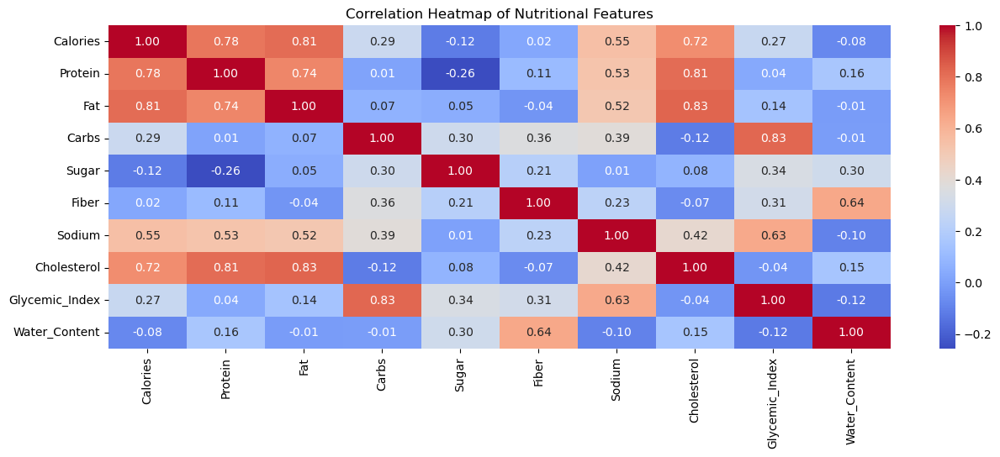

In [12]:
# Correlation Heatmap of Nutritional Features
nutritional_cols = ['Calories', 'Protein', 'Fat', 'Carbs', 'Sugar', 'Fiber',
                    'Sodium', 'Cholesterol', 'Glycemic_Index', 'Water_Content']
plt.figure(figsize=(15, 5))
sns.heatmap(AnalysisData[nutritional_cols].corr(), annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Heatmap of Nutritional Features')
plt.show()


In [13]:
# ****** Balanced Meal Recommendation ******
recommended = AnalysisData[
    (AnalysisData['Calories'] >= 200) & (AnalysisData['Calories'] <= 350) &
    (AnalysisData['Protein'] >= 10) &
    (AnalysisData['Fiber'] >= 2) &
    (AnalysisData['Sugar'] <= 6)
]

# Assuming AnalysisData is a DataFrame already loaded
macros = ['Protein', 'Fat', 'Carbs']
df_macros = AnalysisData[macros]

# Melt the dataframe to long format for Plotly Express
df_long = df_macros.melt(var_name='Macronutrient', value_name='Amount (grams)')

# Create box plot
fig = px.box(df_long, x='Macronutrient', y='Amount (grams)', title='Macronutrient Distribution')
fig.show()


In [14]:
# Education: Healthier vs. Less Healthy Criteria
# Define healthier as low sugar, high fiber, lower calories
AnalysisData['Health_Score'] = (1/AnalysisData['Calories']) + AnalysisData['Fiber'] - (AnalysisData['Sugar']/10)
AnalysisDatasorted = AnalysisData.sort_values("Health_Score", ascending=False)
AnalysisDatasorted[['Food_Name', 'Calories', 'Fiber', 'Sugar', 'Health_Score']].head()



,Food_Name,Calories,Fiber,Sugar,Health_Score
28296,Sushi,1289.956763,18.891993,78.548162,11.037952
4163,Sushi,1289.956763,18.891993,78.548162,11.037952
1876,Steak,1289.956763,18.891993,78.548162,11.037952
7081,Pizza,1289.956763,18.891993,78.548162,11.037952
17280,Ice Cream,1289.956763,18.891993,78.548162,11.037952


**Examine Class Distribution**

Food_Name
Pizza        5900
Burger       4923
Donut        4454
Pasta        3959
Sushi        3450
Ice Cream    2954
Steak        1981
Apple        1471
Banana       1184
Salad         984
Name: count, dtype: int64


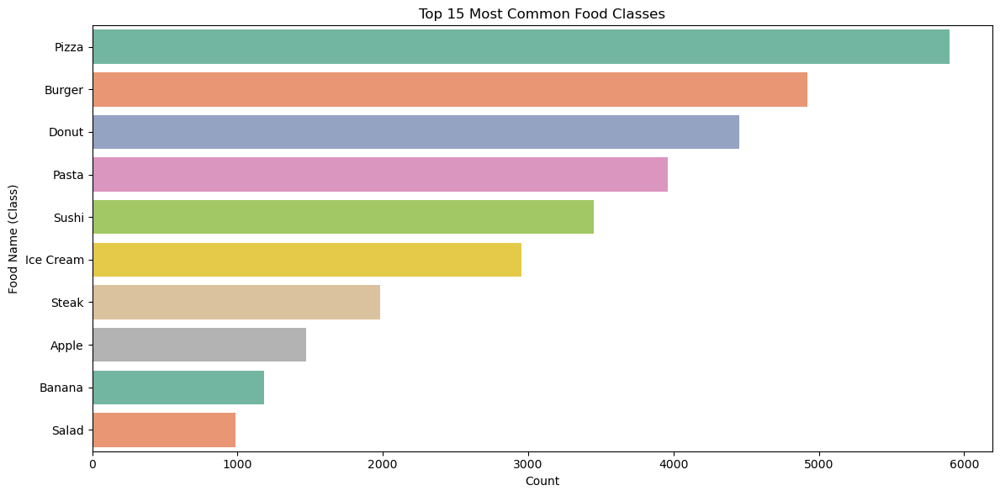

In [15]:
class_counts = df['Food_Name'].value_counts()

print(class_counts)

import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(12,6))
sns.countplot(y='Food_Name', data=df, order=class_counts.index[:15], palette='Set2')
plt.title("Top 15 Most Common Food Classes")
plt.xlabel("Count")
plt.ylabel("Food Name (Class)")
plt.tight_layout()
plt.show()

**Explore Sample Entries Per Class**

In [16]:
df.groupby('Food_Name').apply(lambda x: x.sample(1, random_state=42)).reset_index(drop=True)

,Calories,Protein,Fat,Carbs,Sugar,Fiber,Sodium,Cholesterol,Glycemic_Index,Water_Content,Serving_Size,Meal_Type,Preparation_Method,Is_Vegan,Is_Gluten_Free,Food_Name,Health_Score
0,88.831447,0.669344,0.398466,27.351470,20.585923,4.569030,2.131523,0.000000,46.051619,83.131396,153.699792,lunch,baked,True,True,Apple,2.521694
1,97.010961,1.338769,0.473392,30.501184,19.450946,2.111370,1.703918,0.000000,54.851319,74.842735,117.837979,snack,baked,True,True,Banana,0.176584
2,306.846987,14.486862,17.805457,34.537361,6.730181,1.813538,665.274844,36.239470,65.363053,35.455779,174.767073,dinner,baked,False,False,Burger,1.143779
3,328.065039,3.993657,13.258555,33.194714,18.859529,1.036153,306.221430,17.518108,79.989204,34.873950,78.399789,lunch,grilled,False,False,Donut,-0.846751
4,177.671339,3.087408,11.228801,24.325131,14.172168,0.487824,77.749886,38.633726,51.630425,55.833273,119.810582,lunch,grilled,False,True,Ice Cream,-0.923765
5,274.486057,9.336278,8.952433,42.552637,3.483639,1.956966,17.660852,6.647124,66.577614,47.492309,154.311442,breakfast,baked,False,False,Pasta,1.612245
6,256.777436,9.601692,10.286855,30.723290,5.098955,2.890994,597.658264,25.977209,80.303010,43.905687,213.102624,lunch,baked,False,False,Pizza,2.384993
7,100.522438,2.986105,5.478306,10.181647,2.511372,6.290655,31.892796,0.000000,37.680773,88.021212,106.864796,snack,raw,True,True,Salad,6.049466
8,482.840526,25.530690,13.832976,0.417607,0.255230,0.000000,93.684064,78.306677,0.541242,61.703875,194.716700,dinner,fried,False,True,Steak,-0.023452
9,197.525815,8.448222,5.507184,26.736785,5.276421,2.876665,312.882342,14.924977,66.515860,47.097473,140.799551,breakfast,raw,False,True,Sushi,2.354085


**Outlier Detection & Capping Using IQR Method**

In [17]:
import numpy as np

def cap_outliers(df, column):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower = Q1 - 1.5 * IQR
    upper = Q3 + 1.5 * IQR
    df[column] = np.where(df[column] < lower, lower,
                          np.where(df[column] > upper, upper, df[column]))

for col in nutrient_columns:
    cap_outliers(df, col)

print("Outliers capped using IQR method.")

Outliers capped using IQR method.


**Normalize Numerical Features**

In [18]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
df[nutrient_columns] = scaler.fit_transform(df[nutrient_columns])

print("Numerical features normalized (StandardScaler).")

Numerical features normalized (StandardScaler).


**Encode Class Labels**

In [19]:
from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()
df['Food_Label'] = label_encoder.fit_transform(df['Food_Name'])

label_mapping = dict(zip(label_encoder.classes_, label_encoder.transform(label_encoder.classes_)))
print("Sample label mapping:\n", dict(list(label_mapping.items())[:10]))

Sample label mapping:
 {'Apple': np.int64(0), 'Banana': np.int64(1), 'Burger': np.int64(2), 'Donut': np.int64(3), 'Ice Cream': np.int64(4), 'Pasta': np.int64(5), 'Pizza': np.int64(6), 'Salad': np.int64(7), 'Steak': np.int64(8), 'Sushi': np.int64(9)}


**Dimensionality Reduction with PCA**

In [20]:
from sklearn.decomposition import PCA

pca = PCA(n_components=0.95)  
principal_components = pca.fit_transform(df[nutrient_columns])

print(f"Original features: {len(nutrient_columns)}")
print(f"Reduced PCA components: {pca.n_components_}")

Original features: 11
Reduced PCA components: 7


In [21]:
#We’ll now create a new DataFrame that combines these PCA components with the label:

pca_columns = [f'PC{i+1}' for i in range(pca.n_components_)]
df_pca = pd.DataFrame(principal_components, columns=pca_columns)

df_pca['Label'] = df['Food_Label'].values

df_pca.head()

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,Label
0,1.706213,0.901039,0.922704,0.135315,-0.289288,-0.799243,0.412142,6
1,-1.179728,-0.141635,-2.137941,0.326711,-0.216279,-0.641952,0.182615,4
2,2.330171,-0.146874,-0.102558,0.291887,0.075785,-0.314537,0.074193,2
3,-0.689727,-0.211868,0.668591,-0.405420,-0.654379,-0.685662,0.628768,9
4,-0.732822,1.365692,-1.812201,0.333041,0.315010,0.962637,0.017664,3


**Train-Test Split**

In [22]:
from sklearn.model_selection import train_test_split

X = df_pca.drop('Label', axis=1)
y = df_pca['Label']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

**Define Classifiers**

In [23]:
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier

models = {
    "Logistic Regression": LogisticRegression(max_iter=1000),
    "Decision Tree": DecisionTreeClassifier(),
    "Random Forest": RandomForestClassifier(),
    "KNN": KNeighborsClassifier(),
    "SVM": SVC(),
    "XGBoost": XGBClassifier(use_label_encoder=False, eval_metric='mlogloss'),
    "Gradient Boosting": GradientBoostingClassifier()
}

**Train Models and Collect Metrics**

In [24]:
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

results = {}

for name, model in models.items():
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    
    acc = accuracy_score(y_test, y_pred)
    report = classification_report(y_test, y_pred, output_dict=True)
    cm = confusion_matrix(y_test, y_pred)
    
    results[name] = {
        'Accuracy': acc,
        'Report': report,
        'Confusion_Matrix': cm
    }
    
    print(f"\n{name}:\nAccuracy: {acc:.4f}")


Logistic Regression:
Accuracy: 0.9866

Decision Tree:
Accuracy: 0.9824

Random Forest:
Accuracy: 0.9883

KNN:
Accuracy: 0.9870

SVM:
Accuracy: 0.9902

XGBoost:
Accuracy: 0.9898

Gradient Boosting:
Accuracy: 0.9880


**Model Accuracy Comparison**

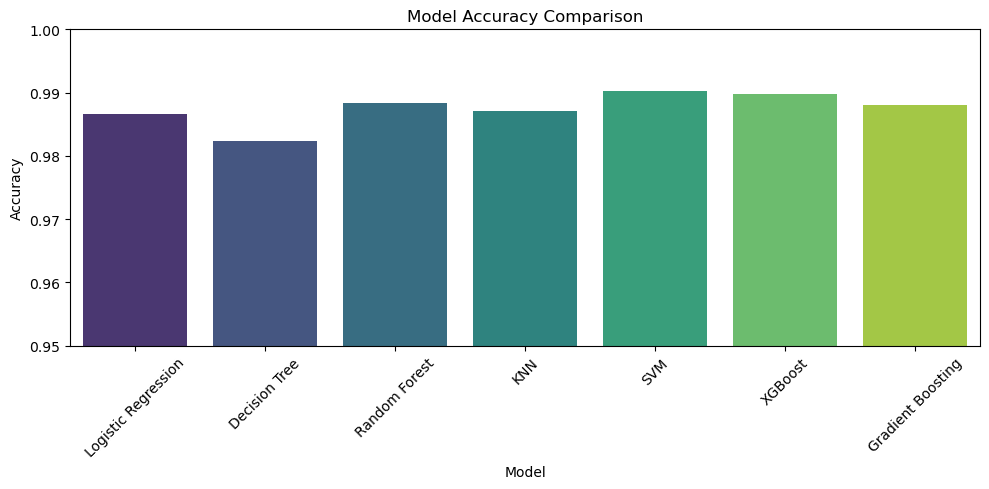

In [25]:
import matplotlib.pyplot as plt
import seaborn as sns

accuracy_data = {model: results[model]['Accuracy'] for model in results}
accuracy_df = pd.DataFrame(list(accuracy_data.items()), columns=["Model", "Accuracy"])

plt.figure(figsize=(10, 5))
sns.barplot(x="Model", y="Accuracy", data=accuracy_df, palette="viridis")
plt.xticks(rotation=45)
plt.ylim(0.95, 1.0)
plt.title("Model Accuracy Comparison")
plt.tight_layout()
plt.show()

**Confusion Matrix Heatmap Example (SVM shown here)**

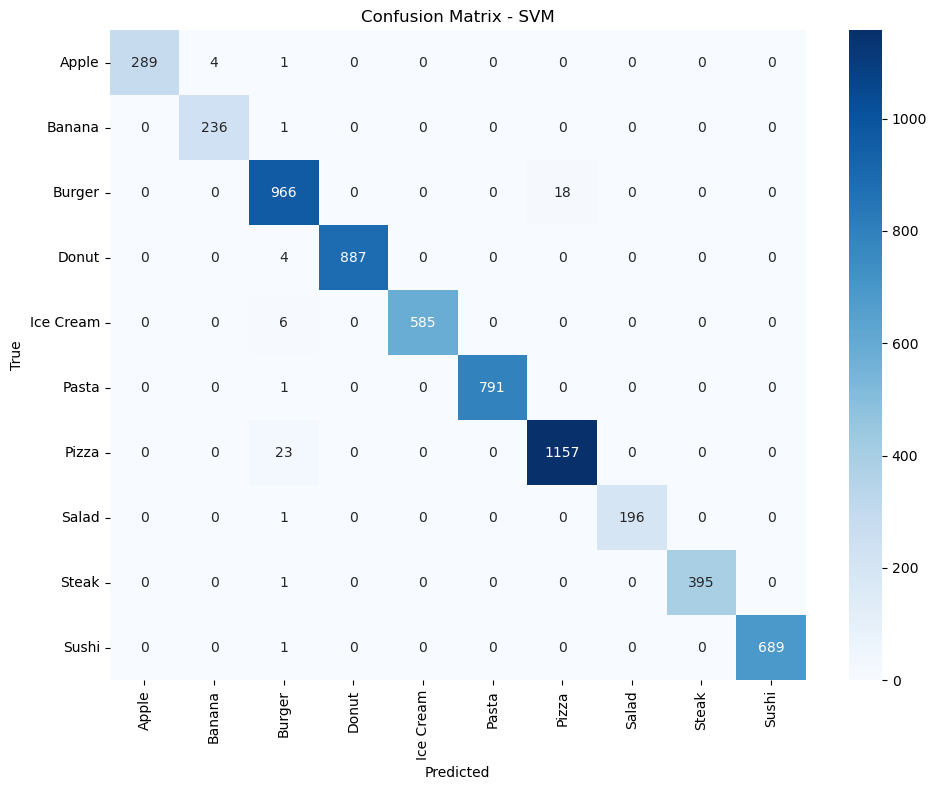

In [27]:
import numpy as np

model_name = "SVM"
cm = results[model_name]["Confusion_Matrix"]
labels = label_encoder.classes_

plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.title(f"Confusion Matrix - {model_name}")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

,Accuracy,Precision,Recall,F1
Model,,,,
SVM,0.9902,0.9929,0.9916,0.9922
XGBoost,0.9898,0.9922,0.9907,0.9914
Random Forest,0.9883,0.9906,0.9891,0.9898
KNN,0.9870,0.9906,0.9891,0.9898
Gradient Boosting,0.9880,0.9903,0.9891,0.9896
Logistic Regression,0.9866,0.9897,0.9885,0.9891
Decision Tree,0.9824,0.9848,0.9833,0.9840



 Best model by macro F1: SVM
Accuracy     0.9902
Precision    0.9929
Recall       0.9916
F1           0.9922
Name: SVM, dtype: float64


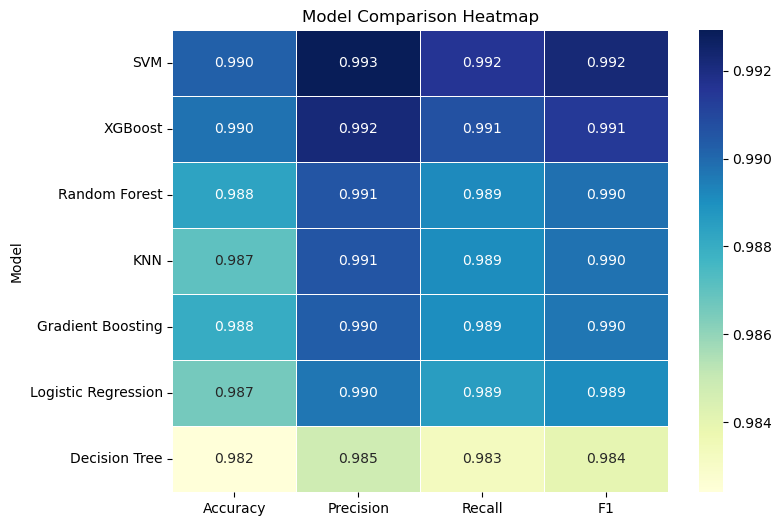

In [32]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
import pandas as pd
import matplotlib.pyplot as plt

# 1. Evaluate only (no training)
summary = []
for name, model in models.items():
    y_pred = model.predict(X_test)  # assumes model is already fitted
    
    summary.append({
        "Model": name,
        "Accuracy": accuracy_score(y_test, y_pred),
        "Precision": precision_score(y_test, y_pred, average='macro', zero_division=0),
        "Recall": recall_score(y_test, y_pred, average='macro', zero_division=0),
        "F1": f1_score(y_test, y_pred, average='macro', zero_division=0)
    })

# 2. Create DataFrame
summary_df = pd.DataFrame(summary).set_index("Model")
summary_df = summary_df.sort_values("F1", ascending=False)
display(summary_df.round(4))

# 3. Best model
best_model = summary_df.index[0]
print(f"\n Best model by macro F1: {best_model}")
print(summary_df.loc[best_model].round(4))

# 4. Comparison plot
plt.figure(figsize=(8,6))
sns.heatmap(summary_df, annot=True, cmap="YlGnBu", fmt=".3f", linewidths=0.5)
plt.title("Model Comparison Heatmap")
plt.show()
